In [16]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt

from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from sklearn import cluster, metrics, decomposition, preprocessing
from sklearn.base import ClusterMixin
from sklearn.manifold import TSNE

from scipy.cluster.hierarchy import dendrogram, linkage

import plotly.express as px
import plotly.graph_objects as go

# Import des modules contenant les fonctions utilitaires
import src.data_helpers as dth

In [17]:
# Réglage des graphiques
plt.style.use('seaborn-whitegrid')

plt.rc('font', size=12)
plt.rc('axes', titlesize=20)
plt.rc('axes', labelsize=20)
plt.rc('xtick', labelsize=12)
plt.rc('ytick', labelsize=12)
plt.rc('legend', fontsize=12)

dims_fig = (25,20)

In [18]:
orders_merge = pd.read_csv('merge.csv', sep=',')

In [161]:
rfm = orders_merge.groupby('customer_unique_id').agg(
    recence = ("order_purchase_timestamp", "max"),
    frequence = ("customer_id", "count"),
    montant_cumulé = ("payment_value", "sum")
)

In [20]:
rfm.head()

,recence,frequence,montant_cumulé
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,1,27.19
0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,1,43.62
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,1,196.89


In [21]:
rfm.info()

<class 'pandas.core.frame.DataFrame'>
Index: 96096 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to ffffd2657e2aad2907e67c3e9daecbeb
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   recence         96096 non-null  object 
 1   frequence       96096 non-null  int64  
 2   montant_cumulé  96096 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 2.9+ MB


In [22]:
rfm[rfm['frequence'] > 1].count()*100 / rfm.shape[0]

recence           3.118756
frequence         3.118756
montant_cumulé    3.118756
dtype: float64

In [162]:
date_format = '%Y-%m-%d %H:%M:%S'
max_date = datetime.strptime(rfm['recence'].max(), date_format)
rfm['recence'] = rfm['recence'].transform(lambda x: (max_date - datetime.strptime(x, date_format)).days)
rfm

,recence,frequence,montant_cumulé
customer_unique_id,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19
0000f46a3911fa3c0805444483337064,585,1,86.22
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62
0004aac84e0df4da2b147fca70cf8255,336,1,196.89
...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,495,1,2067.42
fffea47cd6d3cc0a88bd621562a9d061,310,1,84.58
ffff371b4d645b6ecea244b27531430a,617,1,112.46


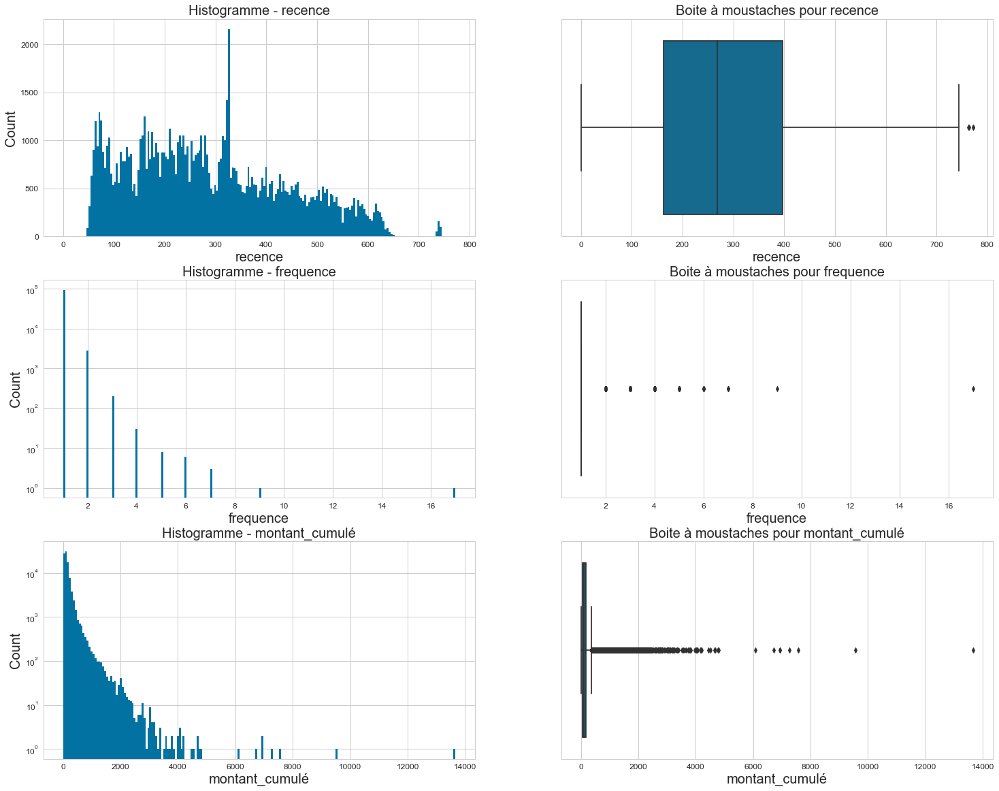

In [11]:
dth.drawHistAndBoxPlot(rfm, rfm.columns, dims_fig)

### Standardisation des données

In [10]:
std_scale = preprocessing.StandardScaler().fit(rfm)
rfm_std = pd.DataFrame(
    std_scale.transform(rfm),
    columns=rfm.columns
)

rfm_std

,recence,frequence,montant_cumulé
0,-0.832621,-0.162368,-0.106697
1,-0.813067,-0.162368,-0.602360
2,1.937662,-0.162368,-0.347291
3,0.529706,-0.162368,-0.531366
4,0.314602,-0.162368,0.130916
...,...,...,...
96091,1.351014,-0.162368,8.213503
96092,0.145126,-0.162368,-0.354377
96093,2.146249,-0.162368,-0.233907
96094,-0.780475,-0.162368,-0.142172


### ACP

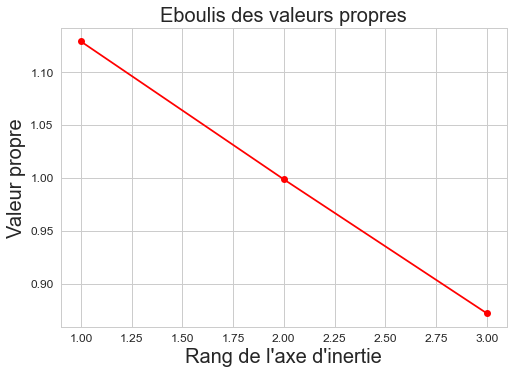

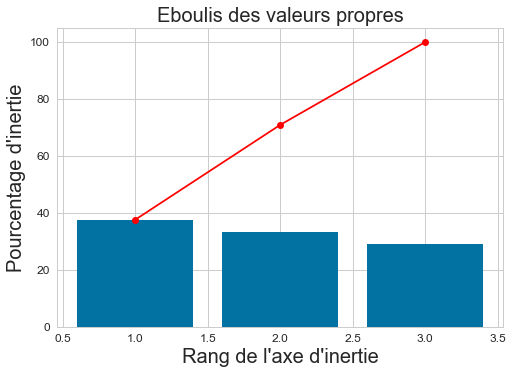

Le nombre de composantes à analyser est de 2


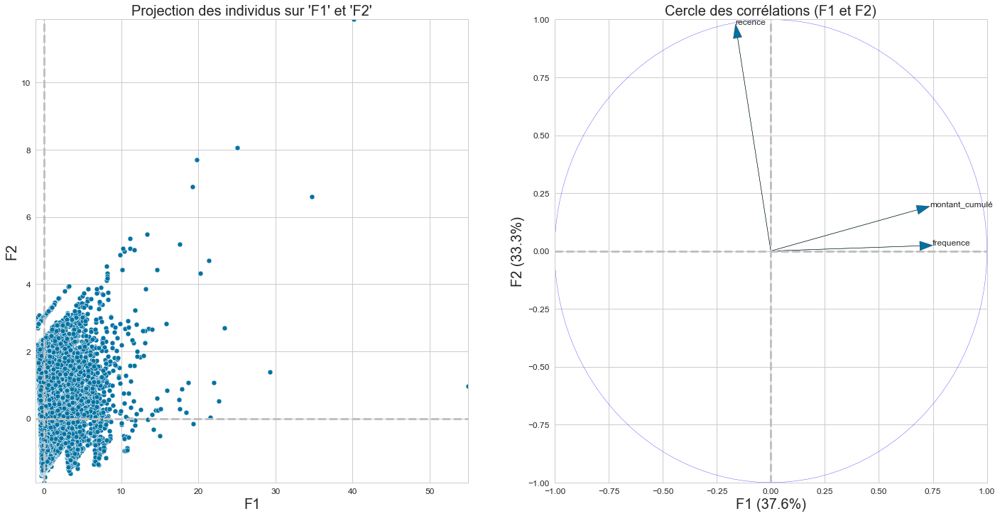

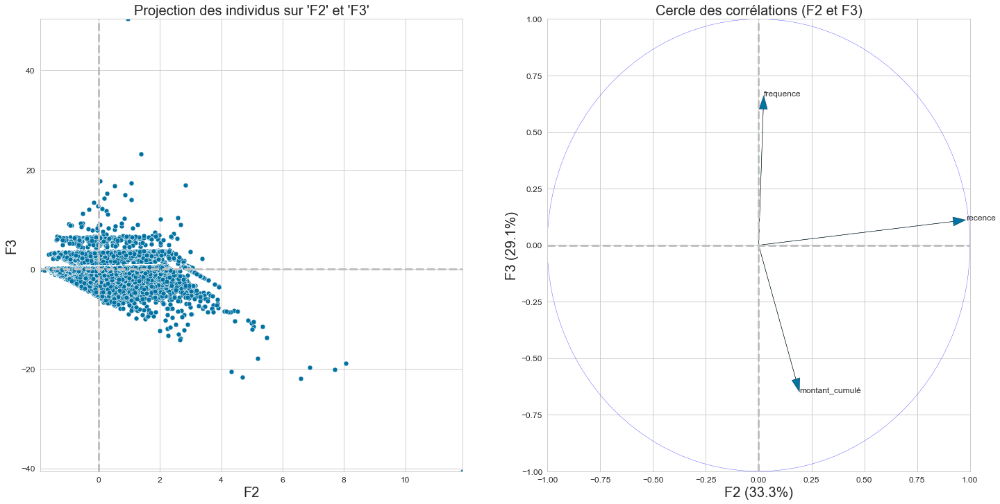

In [51]:
dth.acpAnalysis(rfm_std)

### Clustering hiérarchique

{'icoord': [[5.0, 5.0, 15.0, 15.0],
  [25.0, 25.0, 35.0, 35.0],
  [10.0, 10.0, 30.0, 30.0],
  [45.0, 45.0, 55.0, 55.0],
  [65.0, 65.0, 75.0, 75.0],
  [50.0, 50.0, 70.0, 70.0],
  [20.0, 20.0, 60.0, 60.0]],
 'dcoord': [[0.0, 46.66706943762307, 46.66706943762307, 0.0],
  [0.0, 90.1273993290372, 90.1273993290372, 0.0],
  [46.66706943762307, 99.08418367158265, 99.08418367158265, 90.1273993290372],
  [0.0, 117.19715698065853, 117.19715698065853, 0.0],
  [0.0, 198.8708561039888, 198.8708561039888, 0.0],
  [117.19715698065853,
   240.5799967606504,
   240.5799967606504,
   198.8708561039888],
  [99.08418367158265,
   285.3360342375102,
   285.3360342375102,
   240.5799967606504]],
 'ivl': ['(47)',
  '(1360)',
  '17036',
  '(123)',
  '(6556)',
  '(14851)',
  '(20896)',
  '(4214)'],
 'leaves': [96045, 96076, 17036, 96080, 96073, 96083, 96085, 96091],
 'color_list': ['C1', 'C1', 'C1', 'C2', 'C3', 'C0', 'C0'],
 'leaves_color_list': ['C1', 'C1', 'C1', 'C1', 'C2', 'C2', 'C3', 'C3']}

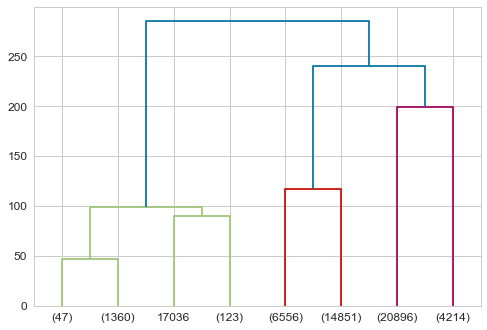

In [12]:
dendrogram(
    linkage(rfm_std.sample(frac=0.5, random_state=42), method="ward"),
    truncate_mode="level",
    p=2,
)

### Méthode des kMeans

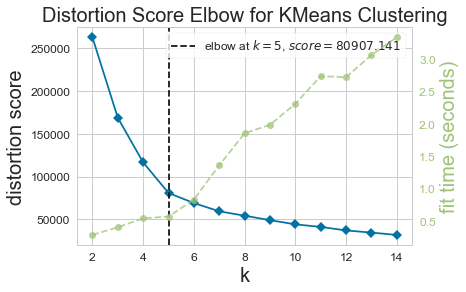

Le nombre optimal de clusters est 5


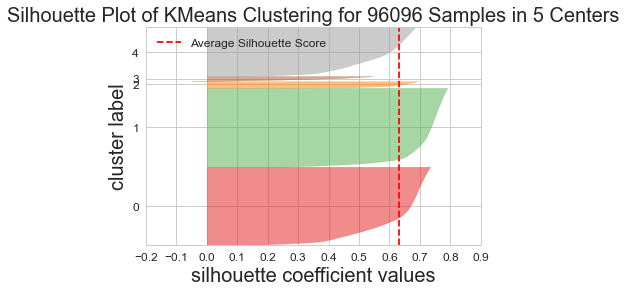

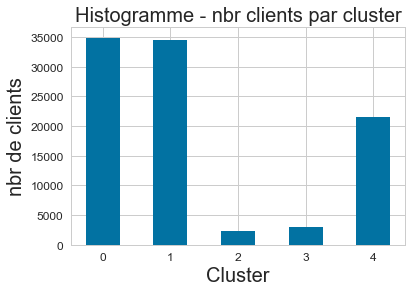

Cluster 0: 34889 clients | 36.31% du total
Cluster 1: 34502 clients | 35.9% du total
Cluster 2: 2259 clients | 2.35% du total
Cluster 3: 2962 clients | 3.08% du total
Cluster 4: 21484 clients | 22.36% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



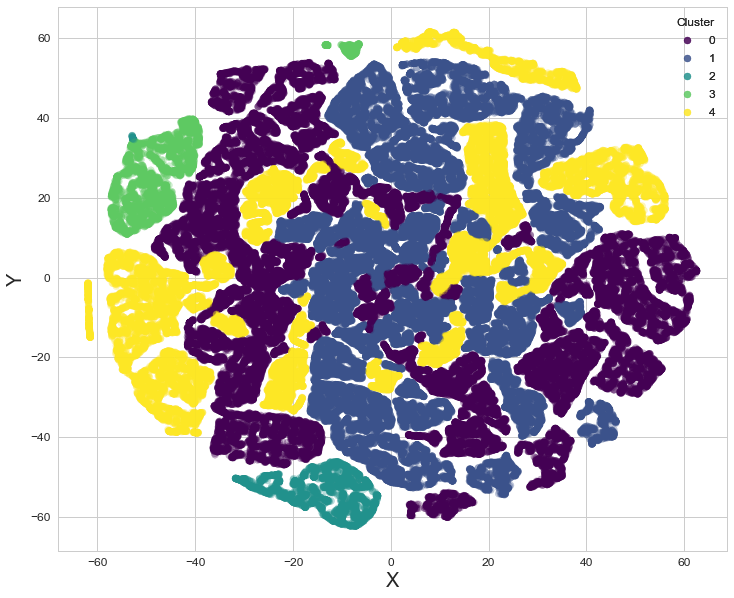

In [88]:
dth.modelCluster(rfm.copy())

In [109]:
a = orders_merge.groupby('customer_unique_id').agg({'customer_unique_id' : 'count'})
a[a['customer_unique_id'] > 1]

,customer_unique_id
customer_unique_id,
00172711b30d52eea8b313a7f2cced02,2
004288347e5e88a27ded2bb23747066c,2
004b45ec5c64187465168251cd1c9c2f,2
0058f300f57d7b93c477a131a59b36c3,2
00a39521eb40f7012db50455bf083460,2
...,...
ff36be26206fffe1eb37afd54c70e18b,3
ff44401d0d8f5b9c54a47374eb48c1b8,2
ff8892f7c26aa0446da53d01b18df463,2


In [113]:
orders_merge['review_score'][orders_merge['customer_unique_id'] == "004b45ec5c64187465168251cd1c9c2f"]

44475    1.0
51242    5.0
Name: review_score, dtype: float64

In [165]:
test = orders_merge.groupby('customer_unique_id').agg(
    review_score = ("review_score", "mean")
)
test

,review_score
customer_unique_id,
0000366f3b9a7992bf8c76cfdf3221e2,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,4.0
0000f46a3911fa3c0805444483337064,3.0
0000f6ccb0745a6a4b88665a16c9f078,4.0
0004aac84e0df4da2b147fca70cf8255,5.0
...,...
fffcf5a5ff07b0908bd4e2dbc735a684,5.0
fffea47cd6d3cc0a88bd621562a9d061,4.0
ffff371b4d645b6ecea244b27531430a,5.0


In [166]:
rfm['review_score'] = test['review_score'].values

In [172]:
rfm

,recence,frequence,montant_cumulé,review_score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19,4.0
0000f46a3911fa3c0805444483337064,585,1,86.22,3.0
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62,4.0
0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,495,1,2067.42,5.0
fffea47cd6d3cc0a88bd621562a9d061,310,1,84.58,4.0
ffff371b4d645b6ecea244b27531430a,617,1,112.46,5.0


In [173]:
index = rfm.index[rfm['review_score'].isnull()]
rfm = rfm.drop(index=index)
rfm

,recence,frequence,montant_cumulé,review_score
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,160,1,141.90,5.0
0000b849f77a49e4a4ce2b2a4ca5be3f,163,1,27.19,4.0
0000f46a3911fa3c0805444483337064,585,1,86.22,3.0
0000f6ccb0745a6a4b88665a16c9f078,369,1,43.62,4.0
0004aac84e0df4da2b147fca70cf8255,336,1,196.89,5.0
...,...,...,...,...
fffcf5a5ff07b0908bd4e2dbc735a684,495,1,2067.42,5.0
fffea47cd6d3cc0a88bd621562a9d061,310,1,84.58,4.0
ffff371b4d645b6ecea244b27531430a,617,1,112.46,5.0


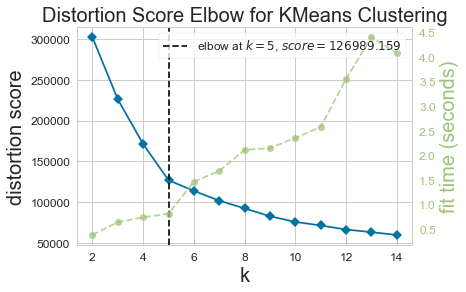

Le nombre optimal de clusters est 5


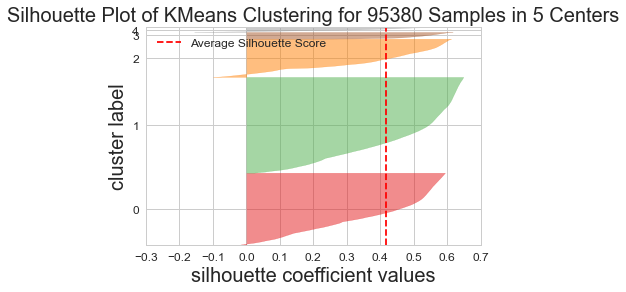

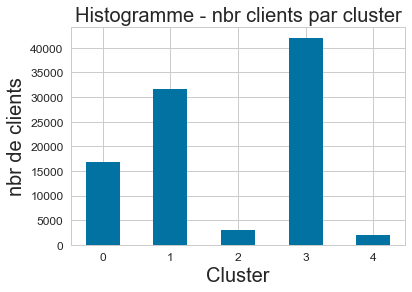

Cluster 0: 16756 clients | 17.57% du total
Cluster 1: 31619 clients | 33.15% du total
Cluster 2: 2953 clients | 3.1% du total
Cluster 3: 42047 clients | 44.08% du total
Cluster 4: 2005 clients | 2.1% du total


C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

C:\DEV\.env\anaconda3\envs\projet_5\lib\site-packages\sklearn\manifold\_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



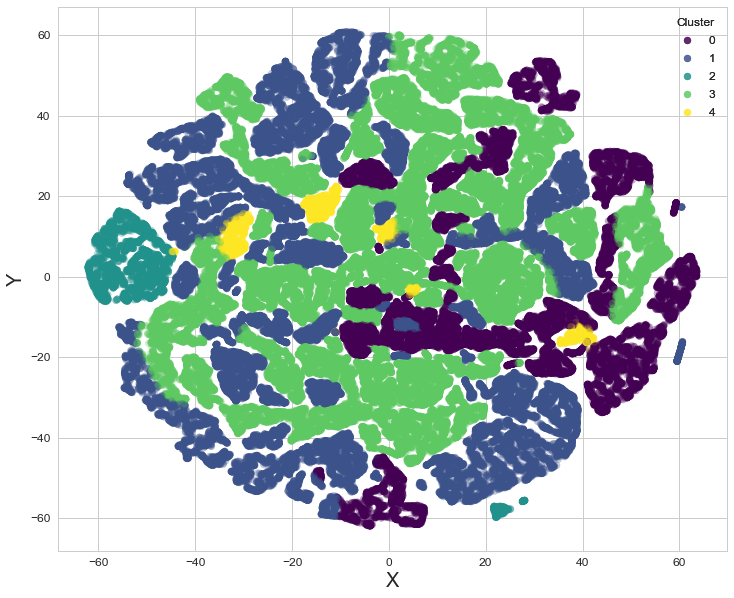

In [175]:
dth.modelCluster(rfm.copy())

In [176]:
orders_merge.columns

Index(['order_id', 'customer_id', 'order_status', 'order_purchase_timestamp',
       'order_approved_at', 'order_delivered_carrier_date',
       'order_delivered_customer_date', 'order_estimated_delivery_date',
       'payment_type', 'payment_installments', 'payment_value', 'review_score',
       'customer_unique_id', 'customer_zip_code_prefix', 'customer_city',
       'customer_state', 'customer_geolocation_lat',
       'customer_geolocation_lng', 'product_id', 'seller_id',
       'shipping_limit_date', 'price', 'freight_value',
       'product_category_name', 'product_name_lenght',
       'product_description_lenght', 'product_photos_qty', 'product_weight_g',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'seller_zip_code_prefix', 'seller_city', 'seller_state',
       'seller_geolocation_lat', 'seller_geolocation_lng'],
      dtype='object')